In [1]:
import os 

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"
#os.environ["CUDA_LAUNCH_BLOCKING"] = 1

import random
import numpy as np
import matplotlib.pyplot as plt

import json
import cv2
from tqdm import tqdm
from PIL import Image

PATH = "/storage/faisal/7.2.e_optha_MA"
train_image_dir = os.path.join(PATH, "training/images")
train_ann_dir = os.path.join(PATH, "training/ground_truth/Microaneurysms")
val_image_dir = os.path.join(PATH, "validation/images")
val_ann_dir = os.path.join(PATH, "validation/ground_truth/Microaneurysms")
test_image_dir = os.path.join(PATH, "test/images")
test_ann_dir = os.path.join(PATH, "test/ground_truth/Microaneurysms")
train_image_names = sorted(os.listdir(train_image_dir))
train_ann_names = sorted(os.listdir(train_ann_dir))
val_image_names = sorted(os.listdir(val_image_dir))
val_ann_names = sorted(os.listdir(val_ann_dir))
test_image_names = sorted(os.listdir(test_image_dir))
test_ann_names = sorted(os.listdir(test_ann_dir))



import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms.functional as TF 
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

class SEGDataset(Dataset):
    def __init__(self, image_dir, ann_dir, image_names_list, ann_names_list, transform = None):
        super(SEGDataset, self).__init__()
        self.image_dir = image_dir
        self.ann_dir = ann_dir
        self.images = image_names_list
        self.anns = ann_names_list
        self.transform = transform
    def __len__(self):
        return len(self.images)
    def __getitem__(self, index):
        image_path = os.path.join(self.image_dir, self.images[index])
        ann_path = os.path.join(self.ann_dir, self.anns[index])
        
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        mask = cv2.imread(ann_path, cv2.IMREAD_GRAYSCALE)
        #mask = Image.open(ann_path)
        #mask = np.array(mask)
        mask[mask > 1] = 1
        mask[mask < 1] = 0
        '''ann_file = open(ann_path)
        ann_data = json.load(ann_file)
        #tile_example(img_path, mask_rle, ex_id, organ, 
        mask = np.zeros(shape = image.shape[:-1])
        for idx in range(len(ann_data)):
            ann = [np.array(ann_data[idx], dtype = np.int32)]
            cv2.fillPoly(mask, pts = ann, color = (255, 255, 255))'''
        
        # mask[mask >= 128.0] = 1
        # mask[mask < 128.0] = 0
        
        if self.transform is not None:
            transformer = self.transform(image = image, mask = mask)
            image, mask = transformer["image"], transformer["mask"]
            
        return image, mask
    
#Splitting into train and val sets
random.seed(53)
np.random.seed(53)
torch.manual_seed(53)
'''np.random.shuffle(image_names)
N = len(image_names)
train_len = int(0.9 * N)
val_len = N - train_len'''
#train_image_names = image_names[:train_len]
#val_image_names = image_names[train_len:]
#print(f"No. of training images = {train_len}")
#print(f"No. of validation images = {val_len}")

def get_dataloaders(img_size = 256, batch_size = 16, image_dir = None, ann_dir = None, train_image_dir = None, val_ann_dir = None, test_ann_dir = None,
                    train_image_names = None, train_ann_names = None, val_image_names = None, val_ann_names = None, test_image_names = None, test_ann_names = None):
    
    
    train_transforms = A.Compose([
        A.PadIfNeeded(min_height=2544, min_width=2544, p=1),
        A.CenterCrop(p=1, height=2048, width=2048),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.HorizontalFlip(p = 0.5),
        A.VerticalFlip(p = 0.5),
        A.Rotate(limit = 90, p = 0.5),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    val_transforms = A.Compose([
        A.PadIfNeeded(min_height=2544, min_width=2544, border_mode=cv2.BORDER_CONSTANT, p=1),
        A.CenterCrop(p=1, height=2048, width=2048),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    test_transforms = A.Compose([
        A.PadIfNeeded(min_height=2544, min_width=2544, border_mode=cv2.BORDER_CONSTANT, p=1),
        A.CenterCrop(p=1, height=2048, width=2048),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    

    train_dataset = SEGDataset(image_dir, ann_dir, train_image_names, train_ann_names, train_transforms)
    val_dataset = SEGDataset(val_image_dir, val_ann_dir, val_image_names, val_ann_names, val_transforms)
    test_dataset = SEGDataset(test_image_dir, test_ann_dir, test_image_names, test_ann_names, test_transforms)

    g_seed = torch.Generator()
    g_seed.manual_seed(0)

    train_loader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, pin_memory = True, num_workers = 8)
    val_loader = DataLoader(val_dataset, batch_size = batch_size, shuffle = False, pin_memory = True, num_workers = 8)
    test_loader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, pin_memory = True, num_workers = 8)
    
    return train_loader, val_loader, test_loader

/home/faisal/.conda/envs/faisalk/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# SUMNet

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from torchvision import transforms,datasets
import torch.optim as optim
from torch.autograd import Variable
from torch.optim.lr_scheduler import ReduceLROnPlateau
#from focal_loss.focal_loss import FocalLoss
import torchvision
import sys
#from torchsummary import summary
from ptflops import get_model_complexity_info
from torchinfo import summary
from torchstat import stat


import matplotlib.pyplot as plt
import time
from torchvision import models

import torch
import torch.nn as nn
import torch.nn.functional as F


class SUMNet_all_bn(nn.Module):
	def __init__(self,in_ch,out_ch):
		super(SUMNet_all_bn, self).__init__()
		
		self.conv1     = nn.Conv2d(in_ch,64,3,padding=1)
		self.bn1       = nn.BatchNorm2d(64,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.conv2     = nn.Conv2d(64,128,3,padding=1)   
		self.bn2       = nn.BatchNorm2d(128,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.pool1     = nn.MaxPool2d(2, 2, return_indices = True)
		self.conv3a    = nn.Conv2d(128,256,3,padding=1) 
		self.bn3a       = nn.BatchNorm2d(256,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.conv3b    = nn.Conv2d(256,256,3,padding=1)
		self.bn3b       = nn.BatchNorm2d(256,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.pool2     = nn.MaxPool2d(2, 2, return_indices = True)
		self.conv4a    = nn.Conv2d(256,512,3,padding=1) 
		self.bn4a       = nn.BatchNorm2d(512,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.conv4b    = nn.Conv2d(512,512,3,padding=1)
		self.bn4b       = nn.BatchNorm2d(512,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.pool3     = nn.MaxPool2d(2, 2, return_indices = True)
		self.conv5a    = nn.Conv2d(512,512,3,padding=1) 
		self.bn5a       = nn.BatchNorm2d(512,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.conv5b    = nn.Conv2d(512,512,3,padding=1)
		self.bn5b       = nn.BatchNorm2d(512,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.pool4     = nn.MaxPool2d(2, 2, return_indices = True)  
		
		self.unpool4   = nn.MaxUnpool2d(2, 2)
		self.donv5b    = nn.Conv2d(1024, 512, 3, padding = 1)
		self.dbn5b     = nn.BatchNorm2d(512,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.donv5a    = nn.Conv2d(512, 512, 3, padding = 1)
		self.dbn5a     = nn.BatchNorm2d(512,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.unpool3   = nn.MaxUnpool2d(2, 2)
		self.donv4b    = nn.Conv2d(1024, 512, 3, padding = 1)
		self.dbn4b     = nn.BatchNorm2d(512,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.donv4a    = nn.Conv2d(512, 256, 3, padding = 1)
		self.dbn4a     = nn.BatchNorm2d(256,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.unpool2   = nn.MaxUnpool2d(2, 2)
		self.donv3b    = nn.Conv2d(512, 256, 3, padding = 1)
		self.dbn3b     = nn.BatchNorm2d(256,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.donv3a    = nn.Conv2d(256,128, 3, padding = 1)
		self.dbn3a     = nn.BatchNorm2d(128,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.unpool1   = nn.MaxUnpool2d(2, 2)
		self.donv2     = nn.Conv2d(256, 64, 3, padding = 1)
		self.dbn2      = nn.BatchNorm2d(64,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.donv1     = nn.Conv2d(128, 32, 3, padding = 1)
		self.dbn1       = nn.BatchNorm2d(32,eps=1e-5,momentum=0.1,affine=True,track_running_stats=True)
		self.output    = nn.Conv2d(32, out_ch, 1)        
	   
		
	def forward(self, x):
		conv1          = F.relu(self.bn1(self.conv1(x)), inplace = True)
		conv2          = F.relu(self.bn2(self.conv2(conv1)), inplace = True)
		pool1, idxs1   = self.pool1(conv2)        
		conv3a         = F.relu(self.bn3a(self.conv3a(pool1)), inplace = True)
		conv3b         = F.relu(self.bn3b(self.conv3b(conv3a)), inplace = True)
		pool2, idxs2   = self.pool2(conv3b)
		conv4a         = F.relu(self.bn4a(self.conv4a(pool2)), inplace = True)
		conv4b         = F.relu(self.bn4b(self.conv4b(conv4a)), inplace = True)
		pool3, idxs3   = self.pool3(conv4b)
		conv5a         = F.relu(self.bn5a(self.conv5a(pool3)), inplace = True)
		conv5b         = F.relu(self.bn5b(self.conv5b(conv5a)), inplace = True)
		pool4, idxs4   = self.pool4(conv5b)
		
		unpool4        = torch.cat([self.unpool4(pool4, idxs4), conv5b], 1)
		donv5b         = F.relu(self.dbn5b(self.donv5b(unpool4)), inplace = True)
		donv5a         = F.relu(self.dbn5a(self.donv5a(donv5b)), inplace = True)
		unpool3        = torch.cat([self.unpool4(donv5a, idxs3), conv4b], 1)
		donv4b         = F.relu(self.dbn4b(self.donv4b(unpool3)), inplace = True)
		donv4a         = F.relu(self.dbn4a(self.donv4a(donv4b)), inplace = True)
		unpool2        = torch.cat([self.unpool3(donv4a, idxs2), conv3b], 1)
		donv3b         = F.relu(self.dbn3b(self.donv3b(unpool2)), inplace = True)
		donv3a         = F.relu(self.dbn3a(self.donv3a(donv3b)), inplace = True)
		unpool1        = torch.cat([self.unpool2(donv3a, idxs1), conv2], 1)
		donv2          = F.relu(self.dbn2(self.donv2(unpool1)), inplace = True)
		donv1          = F.relu(self.dbn1(self.donv1(torch.cat([donv2,conv1],1))), inplace = True)
		output         = self.output(donv1)          
	   
		return output  

In [3]:
def validate(model, loader, epoch, device = 'cpu'):
    model.eval()
    loss_ep = 0
    dice_coeff_ep = 0.0
    jaccard_indx = 0
    f1_ep = 0
    with torch.no_grad():
        for idx, (images, masks) in enumerate(loader):
            images = images.to(device)
            masks = masks.to(device).long()
            
            outputs = model(images)
            #outputs = F.sigmoid(model(images))
            #criterion = FocalLoss(gamma= 2, alpha = alpha)
            loss = criterion(outputs, masks)
            #loss = criterion(outputs, masks.unsqueeze(1).float())
            _, pred = outputs.max(1)
            #num_correct += (pred == masks).sum()
            #num_samples += pred.size(0)
            #dice_coeff_ep += dice_coeff_binary(pred.detach(), masks.to(device).unsqueeze(1))
            dice_coeff_ep += dice(pred.detach(), masks.to(device).unsqueeze(1), average = 'weighted', num_classes = 2)
            jaccard_indx += ji(pred.detach(), masks.to(device), 'multiclass', num_classes=2)
            f1_ep += f1_score(pred.detach(), masks.to(device), 'multiclass', average = 'macro', multidim_average= 'global', num_classes = 2)
            loss_ep += loss.item()
    val_loss = loss_ep/len(loader)
    dice_coeff = dice_coeff_ep/len(loader)
    jac_indx = jaccard_indx/len(loader)
    f1 = f1_ep/len(loader)
    return val_loss, dice_coeff, jac_indx , f1

In [4]:
from torchmetrics.functional import jaccard_index as ji
from torchmetrics.functional import dice
from torchmetrics.functional import f1_score

#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = 'cpu'
img_size = 1024
batch_size = 8

train_loader, val_loader, test_loader = get_dataloaders(img_size, batch_size, train_image_dir, train_ann_dir, val_image_dir, val_ann_dir, test_ann_dir, train_image_names, train_ann_names, val_image_names, val_ann_names, test_image_names, test_ann_names)

#model = MeDiAUNET(in_channels = 3, out_channels = 2 ,features = [64, 128, 256, 512])
#model = MeDiAUNET(in_channels = 3, out_channels = 2)
#model = SUMNet_all_bn(in_ch=3,out_ch=2)


In [6]:
#model = AUNet(in_c=3, n_classes=2, layers=[8,16,32,64], conv_bridge=True, shortcut=True)
model = SUMNet_all_bn(in_ch=3,out_ch=2)

model.to(device)
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/Little_AUNet/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/SUMNet/weights"
checkpoint_dir = "/home/faisal/SUMNet/7.2.e_optha_MA/Microaneurysms lr_0.01/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/UNext/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/ResUNet++/weights"
model.load_state_dict(torch.load(os.path.join(checkpoint_dir, "best_weight.tar"), map_location = torch.device('cpu'))["model_state_dict"])
#model.to('cuda')
model.eval()


SUMNet_all_bn(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3a): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3a): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3b): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3b): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv4a): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4a): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine

In [7]:
from ptflops import get_model_complexity_info
from torchinfo import summary
from torchstat import stat
def test_model():
    mod = SUMNet_all_bn(in_ch=3,out_ch=2)
    #x = torch.randn((1, 3, 512, 512))
    #mod.cuda()
    #pred = mod(x)
    #print(stat(mod, input_size=(3, 512, 512)))
    #print(summary(mod, input_size=(1, 3, 512, 512)))
    macs, params = get_model_complexity_info(mod, (3, 1024, 1024),
                                             as_strings=True,
                                             print_per_layer_stat=False)
    print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
    print('{:<30}  {:<8}'.format('Number of parameters: ', params))
    
    #print(pred.shape)

test_model()

Computational complexity:       1705.0 GMac
Number of parameters:           23.87 M 


100%|██████████| 8/8 [01:36<00:00, 12.09s/it]


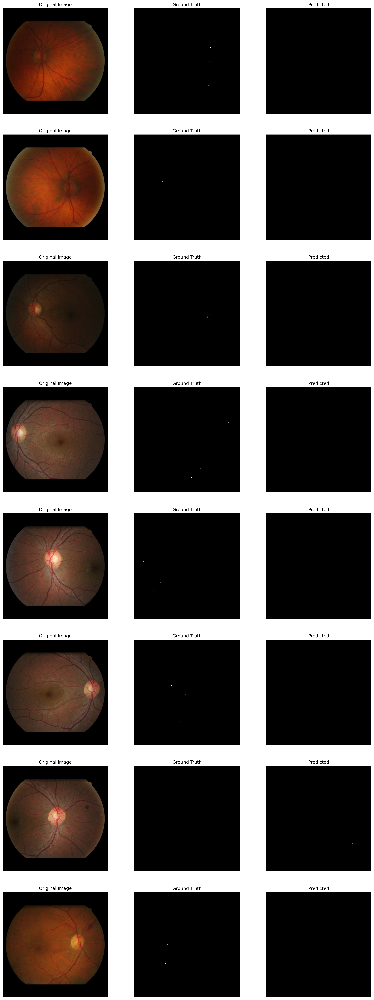

In [8]:

fig, ax = plt.subplots(nrows = 8, ncols = 3, figsize = (18, 8*6), dpi = 300)
imgs, masks = next(iter(test_loader))
for i in tqdm(range(8)):
    dice_coeff_ep = 0
    jaccard_indx =0
    f1_ep = 0
    img = imgs[i]
    mask = masks[i].numpy()
    mask[mask == 1] == 255
    with torch.no_grad():
        output = model(img.unsqueeze(0))
        _, pred_mask = output.max(1)
        pred_mask = pred_mask.squeeze(0).numpy()
        pred_mask[pred_mask == 1] = 255
        # images = imgs[i].to(device)
        # masks = masks[i].to(device).long()
        # outputs = model(images.unsqueeze(0))
        # _, pred = outputs.max(1)

        # dice_coeff_ep = dice(pred.detach(), masks.to(device).unsqueeze(1), average = 'weighted', num_classes = 2)
        # jaccard_indx = ji(pred.detach(), masks.to(device).unsqueeze(1), 2)
        # f1_ep = f1_score(pred.detach(), masks.to(device).unsqueeze(1), average = 'macro', mdmc_average= 'global', num_classes = 2)
        # else:
        #     dice_coeff_ep = dice(pred.detach().float(), masks.to(device).unsqueeze(1))
        #     jaccard_indx = ji(pred.detach().float(), masks.to(device).unsqueeze(1), 2)
        #     f1_ep = f1_score(pred.detach().float(), masks.to(device).unsqueeze(1), average = 'macro', mdmc_average= 'global', num_classes = 2)
    img = img.permute(1,2,0).numpy()
    ax[i,0].imshow(img)
    ax[i,0].set_title('Original Image')
    ax[i,0].axis('off')
    ax[i,1].set_title('Ground Truth')
    ax[i,1].imshow(mask, cmap = 'gray')
    ax[i,1].axis('off')
    ax[i,2].set_title('Predicted')#, dice coeff={dice_coeff_ep}, Jac Index={jaccard_indx}, F1 Score={f1_ep}'.format(dice_coeff_ep=dice_coeff_ep,jaccard_indx=jaccard_indx,f1_ep=f1_ep), fontsize = 10)
    ax[i,2].imshow(pred_mask, cmap = 'gray')
    ax[i,2].axis('off')
plt.savefig('/home/faisal/SUMNet/7.2.e_optha_MA/Microaneurysms lr_0.01/SUMNet_pred_Microaneurysms.png')
plt.show()

In [9]:
criterion = nn.CrossEntropyLoss()
validate(model, test_loader, epoch=1)

(0.0010290031787008047, tensor(0.9998), tensor(0.5466), tensor(0.5844))

In [10]:
criterion = nn.CrossEntropyLoss()
validate(model, val_loader, epoch=1)

(0.0005241911858320236, tensor(0.9999), tensor(0.5423), tensor(0.5747))